# DTSA 5511 - Deep Learning - CNN Cancer Detection Mini-Project


---
### Contents
1. Setup and imports
2. Introduction and overview of the problem
3. Description of the data and EDA
4. Modeling
5. Results and analysis


---
### 1. Setup and imports

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
gpu_count = 0
if gpu_info.find('command not found') >= 0:
  print('CUDA not installed')
elif gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)
  gpu_count = !nvidia-smi -L | wc -l
print('GPU count:', gpu_count)

Sun Mar 10 18:32:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0              25W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
from google.colab import userdata, files, drive
# drive.mount('/content/drive')
import os
os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')
import kaggle

In [ ]:
%%time
# !mkdir /root/.kaggle
# !cp /content/drive/MyDrive/kaggle/kaggle.json /root/.kaggle/
# !chmod 600 /root/.kaggle/kaggle.json
#!kaggle competitions download -c histopathologic-cancer-detection
!unzip -q /content/drive/MyDrive/kaggle/histopathologic-cancer-detection/histopathologic-cancer-detection.zip

CPU times: user 580 ms, sys: 102 ms, total: 682 ms
Wall time: 1min 53s


In [5]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from PIL import Image
import os
from joblib import dump, load
import plotly.express as px
import plotly.graph_objects as go

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

---
### 2. Introduction and overview of the problem

In this mini-project, we will participate in the Kaggle competition named "Histopathologic Cancer Detection". The competition can be found at: https://www.kaggle.com/competitions/histopathologic-cancer-detection/overview.

The objective of this competition is to determine whether sample images contain cancerous cells. While Convolutional Neural Networks have made huge advances in image processing and classification over the last 5-10 years, detecting cancer in medical images is still an unsolved problem.

We will train a baseline CNN and report on its performance. Then we will try different variations on model architecture and learning rates to see if we can improve the performance. Finally, we will make predictions on the Kaggle competition's test set and submit it for scoring.

---
### 3. Description of the data and EDA

The training dataset consists of 220,025 images along with a binary label to indicate whether the image contains metastatic cancer cells. Each image is 96x96 pixels times 3 channels (red, green and blue). There are 130,908 negative cases and 89,117 positive cases in the training set, which represents a slight class imbalance, but not something that will require resampling. There are no missing labels and no duplicates.

Looking at a sample of images of positive and negative cases, reveals that these are indeed images of cells. To my untrained eye, there is no discernable difference between cancerous and non-cancerous cells. Most of the slides show cells with a purple tint, most likely from the staining process used to make the cell's internal structures visible. This purple cast is clearly visible in the RGB histogram, with the distribution of blue and red pixels clearly shifted to the right.

The test dataset consists of 57,458 unlabeled images of the same size as those in the training set.


In [ ]:
labels_df = pd.read_csv('/content/train_labels.csv')
labels_df['label_bool'] = labels_df['label'].astype(bool)
labels_df['label_bin'] = labels_df['label'].astype(str)
labels_df['file_name'] = labels_df['id'] + '.tif'
labels_df

,id,label,label_bool,label_bin,file_name
0,f38a6374c348f90b587e046aac6079959adf3835,0,False,0,f38a6374c348f90b587e046aac6079959adf3835.tif
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1,True,1,c18f2d887b7ae4f6742ee445113fa1aef383ed77.tif
2,755db6279dae599ebb4d39a9123cce439965282d,0,False,0,755db6279dae599ebb4d39a9123cce439965282d.tif
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0,False,0,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08.tif
4,068aba587a4950175d04c680d38943fd488d6a9d,0,False,0,068aba587a4950175d04c680d38943fd488d6a9d.tif
...,...,...,...,...,...
220020,53e9aa9d46e720bf3c6a7528d1fca3ba6e2e49f6,0,False,0,53e9aa9d46e720bf3c6a7528d1fca3ba6e2e49f6.tif
220021,d4b854fe38b07fe2831ad73892b3cec877689576,1,True,1,d4b854fe38b07fe2831ad73892b3cec877689576.tif
220022,3d046cead1a2a5cbe00b2b4847cfb7ba7cf5fe75,0,False,0,3d046cead1a2a5cbe00b2b4847cfb7ba7cf5fe75.tif
220023,f129691c13433f66e1e0671ff1fe80944816f5a2,0,False,0,f129691c13433f66e1e0671ff1fe80944816f5a2.tif


In [ ]:
labels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220025 entries, 0 to 220024
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id          220025 non-null  object
 1   label       220025 non-null  int64 
 2   label_bool  220025 non-null  bool  
 3   label_bin   220025 non-null  object
 4   file_name   220025 non-null  object
dtypes: bool(1), int64(1), object(3)
memory usage: 6.9+ MB


In [ ]:
labels_df['label'].value_counts()

0    130908
1     89117
Name: label, dtype: int64

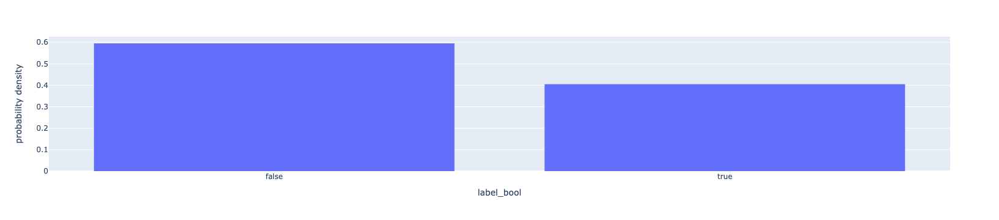

In [3]:
fig = px.histogram(labels_df, x='label_bool', histnorm='probability density')
fig.show()

In [ ]:
labels_df[labels_df['label']==True].sample(5)['id']

53363     1129c7582bc6462a4fa8018b8d7b6bb2ac7763a9
20063     15d75b174c7e6a0d49fea7a7c471caeaa75d4ef0
148111    0f0cc8f02598b4d3ac1d0b2e5875e4d3552c0fe6
164603    a160de3dc02ae5c87bc70684685459b52698e7f2
197040    1ea6f119bd3b2996e64e74d0d2bf40688cc26d37
Name: id, dtype: object

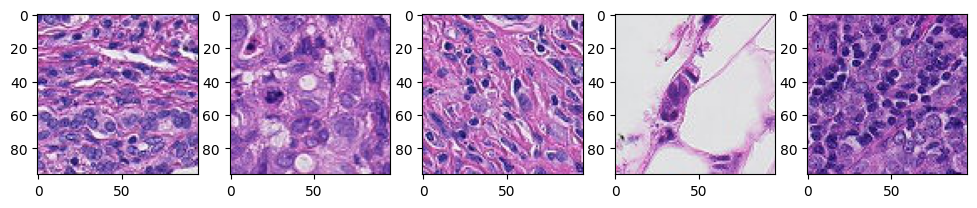

In [ ]:
# Look at some examples with tumors
fig = plt.figure(figsize=(12, 9))
for id, name in enumerate(labels_df[labels_df['label']==True].sample(5)['id']):
    ax = fig.add_subplot(1, 5, id+1)
    im = Image.open('/content/train/' + name + '.tif')
    plt.imshow(im)

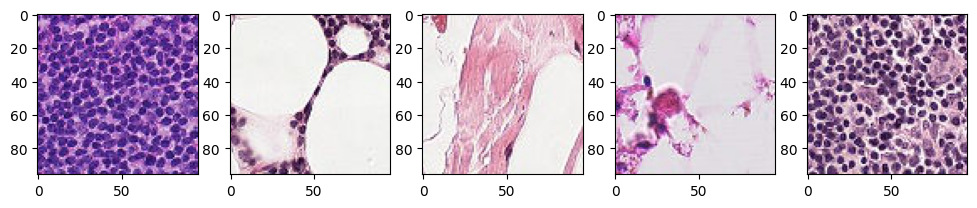

In [ ]:
# And some without
fig = plt.figure(figsize=(12, 9))
for id, name in enumerate(labels_df[labels_df['label']==False].sample(5)['id']):
    ax = fig.add_subplot(1, 5, id+1)
    im = Image.open('/content/train/' + name + '.tif')
    plt.imshow(im)

In [ ]:
img_file_name = labels_df[labels_df['label']==True].sample(1)['id'].iloc[0] + '.tif'
img = np.array(Image.open('/content/train/' + img_file_name))
img.shape

(96, 96, 3)

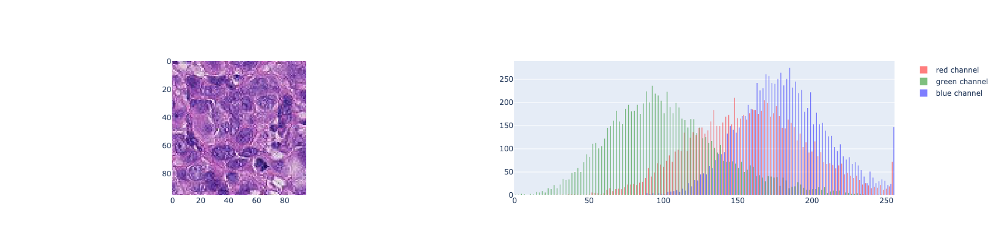

In [15]:
from plotly.subplots import make_subplots
fig = make_subplots(1, 2)
fig.add_trace(go.Image(z=img), 1, 1)
for channel, color in enumerate(['red', 'green', 'blue']):
    fig.add_trace(go.Histogram(x=img[..., channel].ravel(), opacity=0.5,
                               marker_color=color, name='%s channel' %color), 1, 2)
fig.update_layout(height=400)
fig.show()

In [ ]:
test_df = pd.DataFrame(os.listdir('/content/test/'), columns=['file_name'])
test_df

,file_name
0,1c9de83a0cb3e8918884719a158fc4cad3f9d1af.tif
1,b383c963d3236b55a941f9a9503d198ff5491116.tif
2,35b99f7e8df4882ade0ff57aa0f2ae511911b371.tif
3,f78b7600773617b56ec78af1cea5e827422a2a80.tif
4,9c2041bad259eecdf62dcd24c9a75c14a37b6363.tif
...,...
57453,680382b1e26f22d8b36f5b809b04d6920bc78607.tif
57454,9ee5a93349fb649335787585ed5f77d6a8185054.tif
57455,a3a4e7a165fdb629fa995317e3393372f19ad267.tif
57456,35a2ab6b18fd10d3125144146711e62c79edc52c.tif


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57458 entries, 0 to 57457
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  57458 non-null  object
dtypes: object(1)
memory usage: 449.0+ KB


---
### 4. Modeling

In order to make predictions on the test images, we will train a convolutional neural network using Tensorflow and Keras. We will start by creating ImageDataGenerator objects for the training, validation and test data sets. We will then train a small CNN model to make sure the pipelines work and to establish a baseline. From there we will iteratively try to improve the predictions by tweaking the model architecture and hyperparameters.

**Iteration 1:**
- The basic architecture is two repetitions of a convolutional layer followed by a max pooling layer for the feature extraction section. The classification section consists of one fully connected layer with 32 units. For this baseline model, I wanted something with a low parameter count to keep the training time down. This was accomplished by using 2x2 strides.
- At the end of 10 epochs, the training and validation scores are still improving, indicating that we are underfitting and a more complex model is justified.

**Iteration 2:**
- In order to increase model complexity, I added a third repetition of a convolutional layer plus max pooling layer. All other factors unchanged.
- Not a huge improvement over Iteration 1.

**Iteration 3:**
- Changed strides from 2x2 to 1x1. This resulted in a 10x increase in the number of parameters in the model (from 100k to 1M).
- Slight increase in performance, but no signs of overfitting yet, so we will continue to increase model complexity.

**Iteration 4:**
- Added a convolutional layer to each of the three repetitions in the feature extraction section, plus an additional fully connected layer in the classifier. Parameter count increases to 1.3M.
- Significant increase in accuracy score from 0.87 to 0.94.

**Iteration 5:**
- Went back to one Conv layer for each of the three iterations, but increased the number of filters from (32, 64, 128) to (64, 128, 256). Number of parameters explodes to 3.7M.
- Validation accuracy score drops to 0.91 and peaks after 4 epochs, indicating possible overfitting and that 3.7M parameters may be too many.

**Iteration 6:**
- Went back to the architecture from Iteration 4, but with 4 layers in the classification section. Exploring the idea that the feature extraction section is performing well, but that we could benefit from more complexity in the classification part.
- No significant improvement over Iteration 4. Since this model has significantly more parameters than Iteration 4 without any improvement in evaluation metric, we will stick with Iteration 4 as the best architecture so far.

**Iteration 7:**
- Go back to Iteration 4 architecture, but change learning rate to 0.01 (from 0.001).
- Accuracy flatlines around 0.6. This model is not learning anything.

**Iteration 8:**
- Since higher learning rate destroys the model's ability to learn, let's try going to other way. Implemented a learning rate scheduler, using exponential decay.
- Accuracy score improved to 0.94, with room to grow.

**Iteration 9:**
- Since we don't see signs of overfitting, let's try training for more epochs: 20 instead of 10. If validation accuracy score plateau and start to drop, we know we've gone too far. Fixed learning rate at 0.001.
- Accuracy score peaks at 0.94 around epoch 14, but doesn't drop off significantly.

**Iteration 10:**
- Combine ideas from iterations 8 and 9. Train to 20 epochs, but use exponential decay learning rate scheduler to try to narrow down on that local minimum without overshooting.
- Results: best yet accuracy of 0.943 in epoch 18, without significant dropoff in later epochs.


In [ ]:
generator = ImageDataGenerator(rescale=1./255, validation_split=0.2)

In [ ]:
%%time
batch_size = 256
trn_data_gen = generator.flow_from_dataframe(dataframe=labels_df,
                                             target_size=(96,96),
                                             x_col='file_name',
                                             y_col='label_bin',
                                             directory='/content/train/',
                                             subset='training',
                                             batch_size=batch_size,
                                             class_mode='binary',
                                             seed=42)

val_data_gen = generator.flow_from_dataframe(dataframe=labels_df,
                                             target_size=(96,96),
                                             x_col='file_name',
                                             y_col='label_bin',
                                             directory='/content/train/',
                                             subset='validation',
                                             batch_size=batch_size,
                                             class_mode='binary',
                                             seed=42)

tst_data_gen = generator.flow_from_dataframe(dataframe=test_df,
                                             target_size=(96,96),
                                             x_col='file_name',
                                             y_col=None,
                                             directory='/content/test/',
                                             subset=None,
                                             batch_size=batch_size,
                                             class_mode=None,
                                             seed=42,
                                             shuffle=False)

Found 176020 validated image filenames belonging to 2 classes.
Found 44005 validated image filenames belonging to 2 classes.
Found 57458 validated image filenames.
CPU times: user 2.17 s, sys: 1.15 s, total: 3.31 s
Wall time: 3.31 s


In [ ]:
# Iteration 1: Small model
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (2,2)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(32, activation='relu', name='Output_dense_1'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_1')

model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

model.summary()

Model: "Model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1 (Conv2D)      (None, 47, 47, 32)        896       
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 23, 23, 32)        0         
                                                                 
 Convolution_2 (Conv2D)      (None, 11, 11, 64)        18496     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 5, 5, 64)          0         
                                                                 
 Flatten_for_output (Flatte  (None, 1600)              0         
 n)                                                              
                                                                 
 Output_dropout (Dropout)    (None, 1600)              0         
                                                           

In [6]:
if gpu_count > 0:
  history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)
  dump(history, '/content/drive/MyDrive/ML3_hist/history_01')
else:
  history = load('/content/drive/MyDrive/ML3_hist/history_01')

In [8]:
history.history['val_accuracy']

[0.8134757280349731,
 0.8259743452072144,
 0.846494734287262,
 0.8544028997421265,
 0.8599931597709656,
 0.8663333654403687,
 0.8682194948196411,
 0.8591296672821045,
 0.8760595321655273,
 0.8780593276023865]

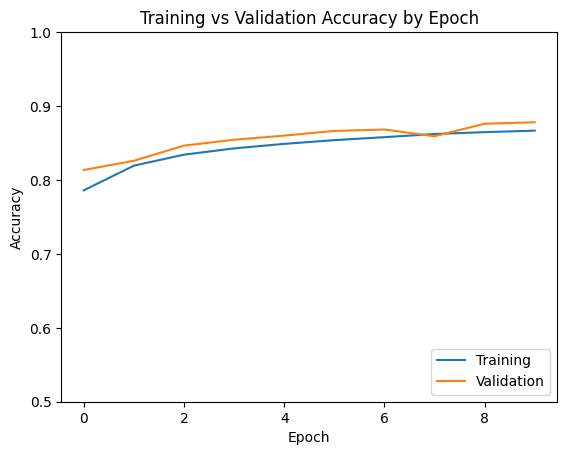

In [ ]:
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Iteration 2: Add a third convolution layer
# Arch: 2x2 strides, 3 conv layers, 1 fully connected layer with 128 units
# Compile options: Adam, BCE

strides = (2,2)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2'),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_2')

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "Model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1 (Conv2D)      (None, 47, 47, 32)        896       
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 23, 23, 32)        0         
                                                                 
 Convolution_2 (Conv2D)      (None, 11, 11, 64)        18496     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 5, 5, 64)          0         
                                                                 
 Convolution_3 (Conv2D)      (None, 2, 2, 128)         73856     
                                                                 
 Max_Pool_3 (MaxPooling2D)   (None, 1, 1, 128)         0         
                                                                 
 Flatten_for_output (Flatte  (None, 128)               0   

In [9]:
if gpu_count > 0:
  history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)
  dump(history, '/content/drive/MyDrive/ML3_hist/history_02')
else:
  history = load('/content/drive/MyDrive/ML3_hist/history_02')

In [10]:
history.history['val_accuracy']

[0.804226815700531,
 0.8438131809234619,
 0.8574934601783752,
 0.8551982641220093,
 0.8660833835601807,
 0.8711510300636292,
 0.8745824098587036,
 0.8793091773986816,
 0.87094646692276,
 0.8765822052955627]

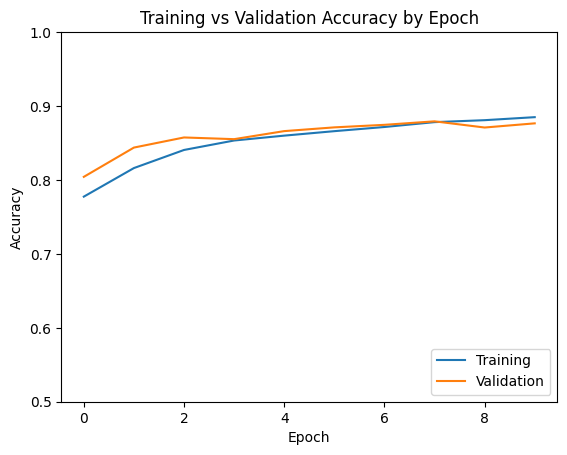

In [ ]:
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Iteration 3: Same as 2 but with strides = 1x1
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

model.summary()

Model: "Model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1 (Conv2D)      (None, 94, 94, 32)        896       
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 47, 47, 32)        0         
                                                                 
 Convolution_2 (Conv2D)      (None, 45, 45, 64)        18496     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 22, 22, 64)        0         
                                                                 
 Flatten_for_output (Flatte  (None, 30976)             0         
 n)                                                              
                                                                 
 Output_dropout (Dropout)    (None, 30976)             0         
                                                           

In [ ]:
if gpu_count > 0:
  history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)
  dump(history, '/content/drive/MyDrive/ML3_hist/history_03')
else:
  history = load('/content/drive/MyDrive/ML3_hist/history_03')

Epoch 1/10
688/688 [==============================] - 144s 206ms/step - loss: 0.5216 - accuracy: 0.7659 - val_loss: 0.4857 - val_accuracy: 0.7964
Epoch 2/10
688/688 [==============================] - 140s 203ms/step - loss: 0.4573 - accuracy: 0.8084 - val_loss: 0.4279 - val_accuracy: 0.8252
Epoch 3/10
688/688 [==============================] - 139s 203ms/step - loss: 0.4127 - accuracy: 0.8286 - val_loss: 0.3834 - val_accuracy: 0.8445
Epoch 4/10
688/688 [==============================] - 139s 202ms/step - loss: 0.3791 - accuracy: 0.8423 - val_loss: 0.3694 - val_accuracy: 0.8456
Epoch 5/10
688/688 [==============================] - 139s 202ms/step - loss: 0.3548 - accuracy: 0.8531 - val_loss: 0.3500 - val_accuracy: 0.8495
Epoch 6/10
688/688 [==============================] - 140s 203ms/step - loss: 0.3347 - accuracy: 0.8607 - val_loss: 0.3351 - val_accuracy: 0.8589
Epoch 7/10
688/688 [==============================] - 142s 206ms/step - loss: 0.3180 - accuracy: 0.8676 - val_loss: 0.3222 -

In [11]:
history = load('/content/drive/MyDrive/ML3_hist/history_03')
history.history['val_accuracy']

[0.7963867783546448,
 0.8252471089363098,
 0.8445404171943665,
 0.8456084728240967,
 0.8494943976402283,
 0.8588569760322571,
 0.8630610108375549,
 0.8794682621955872,
 0.8809908032417297,
 0.8782411217689514]

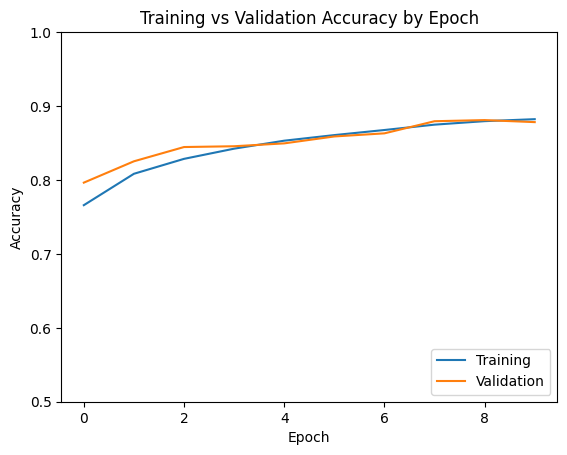

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_03')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Iteration 4: Adding more an additional Conv layer to each group
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

model.summary()

Model: "Model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1_1 (Conv2D)    (None, 94, 94, 32)        896       
                                                                 
 Convolution_1_2 (Conv2D)    (None, 92, 92, 32)        9248      
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 46, 46, 32)        0         
                                                                 
 Convolution_2_1 (Conv2D)    (None, 44, 44, 64)        18496     
                                                                 
 Convolution_2_2 (Conv2D)    (None, 42, 42, 64)        36928     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 21, 21, 64)        0         
                                                                 
 Convolution_3_1 (Conv2D)    (None, 19, 19, 128)       7385

In [ ]:
if gpu_count > 0:
  history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)
  dump(history, '/content/drive/MyDrive/ML3_hist/history_04')
else:
  history = load('/content/drive/MyDrive/ML3_hist/history_04')

Epoch 1/10
688/688 [==============================] - 147s 207ms/step - loss: 0.4400 - accuracy: 0.7971 - val_loss: 0.3505 - val_accuracy: 0.8465
Epoch 2/10
688/688 [==============================] - 140s 204ms/step - loss: 0.3100 - accuracy: 0.8687 - val_loss: 0.2737 - val_accuracy: 0.8866
Epoch 3/10
688/688 [==============================] - 138s 200ms/step - loss: 0.2573 - accuracy: 0.8954 - val_loss: 0.2375 - val_accuracy: 0.9042
Epoch 4/10
688/688 [==============================] - 140s 203ms/step - loss: 0.2253 - accuracy: 0.9114 - val_loss: 0.2143 - val_accuracy: 0.9178
Epoch 5/10
688/688 [==============================] - 144s 210ms/step - loss: 0.2073 - accuracy: 0.9188 - val_loss: 0.1955 - val_accuracy: 0.9245
Epoch 6/10
688/688 [==============================] - 143s 207ms/step - loss: 0.1926 - accuracy: 0.9255 - val_loss: 0.1912 - val_accuracy: 0.9257
Epoch 7/10
688/688 [==============================] - 139s 201ms/step - loss: 0.1740 - accuracy: 0.9342 - val_loss: 0.1902 -

In [12]:
history = load('/content/drive/MyDrive/ML3_hist/history_04')
history.history['val_accuracy']

[0.8465401530265808,
 0.8865583539009094,
 0.9041926860809326,
 0.9178275465965271,
 0.9245312809944153,
 0.9256675243377686,
 0.9259175062179565,
 0.9350528120994568,
 0.9383479356765747,
 0.9370753169059753]

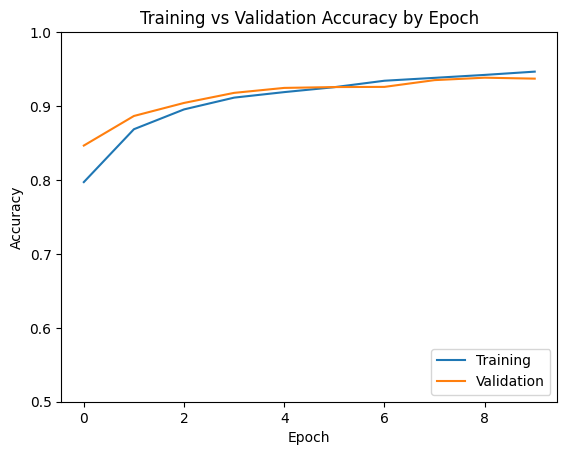

In [ ]:
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Iteration 5: Back to 1 Conv layer per group but increase number of filters.
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(256, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_5')

model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

model.summary()

Model: "Model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1_1 (Conv2D)    (None, 94, 94, 64)        1792      
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 47, 47, 64)        0         
                                                                 
 Convolution_2_1 (Conv2D)    (None, 45, 45, 128)       73856     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 22, 22, 128)       0         
                                                                 
 Convolution_3_1 (Conv2D)    (None, 20, 20, 256)       295168    
                                                                 
 Max_Pool_3 (MaxPooling2D)   (None, 10, 10, 256)       0         
                                                                 
 Flatten_for_output (Flatte  (None, 25600)             0   

In [ ]:
history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)

Epoch 1/10
688/688 [==============================] - 143s 202ms/step - loss: 0.4340 - accuracy: 0.8002 - val_loss: 0.3647 - val_accuracy: 0.8443
Epoch 2/10
688/688 [==============================] - 138s 200ms/step - loss: 0.3470 - accuracy: 0.8507 - val_loss: 0.3465 - val_accuracy: 0.8487
Epoch 3/10
688/688 [==============================] - 140s 203ms/step - loss: 0.3054 - accuracy: 0.8712 - val_loss: 0.2804 - val_accuracy: 0.8844
Epoch 4/10
688/688 [==============================] - 137s 199ms/step - loss: 0.2745 - accuracy: 0.8867 - val_loss: 0.2588 - val_accuracy: 0.8926
Epoch 5/10
688/688 [==============================] - 140s 203ms/step - loss: 0.2513 - accuracy: 0.8976 - val_loss: 0.2348 - val_accuracy: 0.9056
Epoch 6/10
688/688 [==============================] - 140s 204ms/step - loss: 0.2352 - accuracy: 0.9049 - val_loss: 0.2558 - val_accuracy: 0.8949
Epoch 7/10
688/688 [==============================] - 140s 204ms/step - loss: 0.2180 - accuracy: 0.9122 - val_loss: 0.2380 -

In [13]:
history = load('/content/drive/MyDrive/ML3_hist/history_05')
history.history['val_accuracy']

[0.8442904353141785,
 0.8486762642860413,
 0.8843767642974854,
 0.8925803899765015,
 0.9056016206741333,
 0.8948982954025269,
 0.9054198265075684,
 0.9146687984466553,
 0.9042835831642151,
 0.9112146496772766]

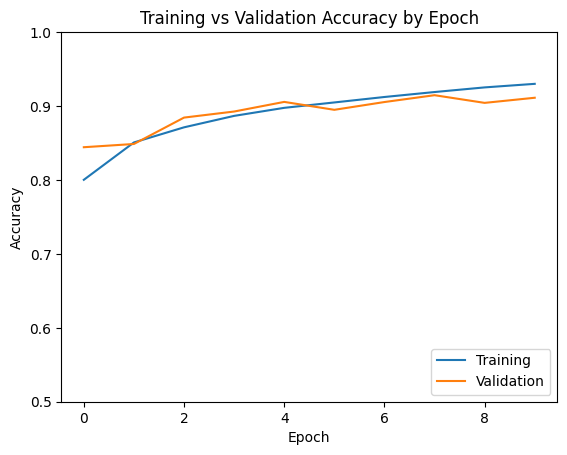

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_5')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')

In [ ]:
# Iteration 6: Back to 2 Conv layers per group, more FC layers at the end
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(256, activation='relu', name='Output_dense_1'),
    Dense(128, activation='relu', name='Output_dense_2'),
    Dense(64, activation='relu', name='Output_dense_3'),
    Dense(32, activation='relu', name='Output_dense_4'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

model.summary()

Model: "Model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1_1 (Conv2D)    (None, 94, 94, 32)        896       
                                                                 
 Convolution_1_2 (Conv2D)    (None, 92, 92, 32)        9248      
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 46, 46, 32)        0         
                                                                 
 Convolution_2_1 (Conv2D)    (None, 44, 44, 64)        18496     
                                                                 
 Convolution_2_2 (Conv2D)    (None, 42, 42, 64)        36928     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 21, 21, 64)        0         
                                                                 
 Convolution_3_1 (Conv2D)    (None, 19, 19, 128)       7385

In [ ]:
history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)

Epoch 1/10
688/688 [==============================] - 144s 205ms/step - loss: 0.4480 - accuracy: 0.7933 - val_loss: 0.3817 - val_accuracy: 0.8290
Epoch 2/10
688/688 [==============================] - 142s 207ms/step - loss: 0.3350 - accuracy: 0.8567 - val_loss: 0.3103 - val_accuracy: 0.8683
Epoch 3/10
688/688 [==============================] - 140s 204ms/step - loss: 0.2783 - accuracy: 0.8850 - val_loss: 0.2555 - val_accuracy: 0.8989
Epoch 4/10
688/688 [==============================] - 142s 206ms/step - loss: 0.2491 - accuracy: 0.8993 - val_loss: 0.2280 - val_accuracy: 0.9104
Epoch 5/10
688/688 [==============================] - 141s 205ms/step - loss: 0.2213 - accuracy: 0.9121 - val_loss: 0.2100 - val_accuracy: 0.9202
Epoch 6/10
688/688 [==============================] - 138s 200ms/step - loss: 0.1992 - accuracy: 0.9229 - val_loss: 0.2165 - val_accuracy: 0.9152
Epoch 7/10
688/688 [==============================] - 140s 203ms/step - loss: 0.1898 - accuracy: 0.9271 - val_loss: 0.2209 -

In [14]:
history = load('/content/drive/MyDrive/ML3_hist/history_06')
history.history['val_accuracy']

[0.8289967179298401,
 0.8683103919029236,
 0.8988751173019409,
 0.9103510975837708,
 0.920236349105835,
 0.9151914715766907,
 0.9182365536689758,
 0.9340302348136902,
 0.9291216731071472,
 0.9366663098335266]

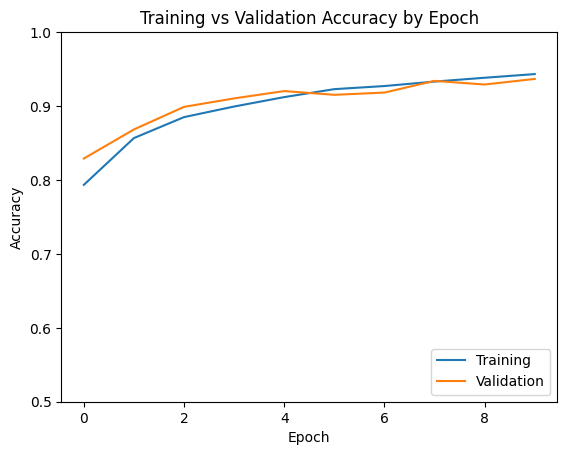

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_6')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')

In [ ]:
# Iteration 7: Change the learning rate=0.01, architecture baseline is #4 (lr=0.001)
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

model.compile(optimizer=Adam(learning_rate=0.01),
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "Model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1_1 (Conv2D)    (None, 94, 94, 32)        896       
                                                                 
 Convolution_1_2 (Conv2D)    (None, 92, 92, 32)        9248      
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 46, 46, 32)        0         
                                                                 
 Convolution_2_1 (Conv2D)    (None, 44, 44, 64)        18496     
                                                                 
 Convolution_2_2 (Conv2D)    (None, 42, 42, 64)        36928     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 21, 21, 64)        0         
                                                                 
 Convolution_3_1 (Conv2D)    (None, 19, 19, 128)       7385

In [ ]:
history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)

Epoch 1/10
688/688 [==============================] - 144s 206ms/step - loss: 0.7175 - accuracy: 0.5931 - val_loss: 0.6746 - val_accuracy: 0.5961
Epoch 2/10
688/688 [==============================] - 139s 203ms/step - loss: 0.6752 - accuracy: 0.5947 - val_loss: 0.6747 - val_accuracy: 0.5961
Epoch 3/10
688/688 [==============================] - 142s 207ms/step - loss: 0.6752 - accuracy: 0.5947 - val_loss: 0.6746 - val_accuracy: 0.5961
Epoch 4/10
688/688 [==============================] - 140s 203ms/step - loss: 0.6752 - accuracy: 0.5947 - val_loss: 0.6746 - val_accuracy: 0.5961
Epoch 5/10
688/688 [==============================] - 143s 208ms/step - loss: 0.6752 - accuracy: 0.5947 - val_loss: 0.6746 - val_accuracy: 0.5961
Epoch 6/10
688/688 [==============================] - 139s 203ms/step - loss: 0.6752 - accuracy: 0.5947 - val_loss: 0.6747 - val_accuracy: 0.5961
Epoch 7/10
688/688 [==============================] - 142s 206ms/step - loss: 0.6752 - accuracy: 0.5947 - val_loss: 0.6745 -

In [15]:
history = load('/content/drive/MyDrive/ML3_hist/history_07')
history.history['val_accuracy']

[0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857,
 0.5961368083953857]

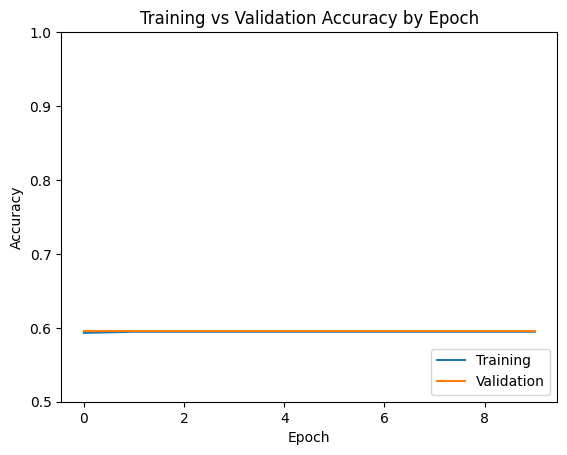

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_7')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')

In [ ]:
# Iteration 8: Exponential decay LR, architecture baseline is #4 (lr=0.001)
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

lr_schedule = ExponentialDecay(initial_learning_rate=0.001,
                               decay_steps=100000,
                               decay_rate=0.96,
                               staircase=True)
adam_optimizer = Adam(learning_rate=lr_schedule)

model.compile(optimizer=adam_optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(trn_data_gen, epochs=10, validation_data=val_data_gen)

Epoch 1/10
688/688 [==============================] - 142s 203ms/step - loss: 0.4352 - accuracy: 0.8013 - val_loss: 0.3807 - val_accuracy: 0.8261
Epoch 2/10
688/688 [==============================] - 140s 203ms/step - loss: 0.3248 - accuracy: 0.8617 - val_loss: 0.2727 - val_accuracy: 0.8905
Epoch 3/10
688/688 [==============================] - 139s 202ms/step - loss: 0.2644 - accuracy: 0.8920 - val_loss: 0.2801 - val_accuracy: 0.8851
Epoch 4/10
688/688 [==============================] - 141s 205ms/step - loss: 0.2299 - accuracy: 0.9085 - val_loss: 0.2460 - val_accuracy: 0.9011
Epoch 5/10
688/688 [==============================] - 142s 207ms/step - loss: 0.2117 - accuracy: 0.9169 - val_loss: 0.2500 - val_accuracy: 0.8994
Epoch 6/10
688/688 [==============================] - 139s 202ms/step - loss: 0.1916 - accuracy: 0.9260 - val_loss: 0.2094 - val_accuracy: 0.9180
Epoch 7/10
688/688 [==============================] - 138s 201ms/step - loss: 0.1790 - accuracy: 0.9317 - val_loss: 0.1978 -

In [16]:
history = load('/content/drive/MyDrive/ML3_hist/history_08')
history.history['val_accuracy']

[0.8260879516601562,
 0.8905124664306641,
 0.8850585222244263,
 0.9011476039886475,
 0.8993977904319763,
 0.9179865717887878,
 0.9250994324684143,
 0.9385524392127991,
 0.9388933181762695,
 0.9346665143966675]

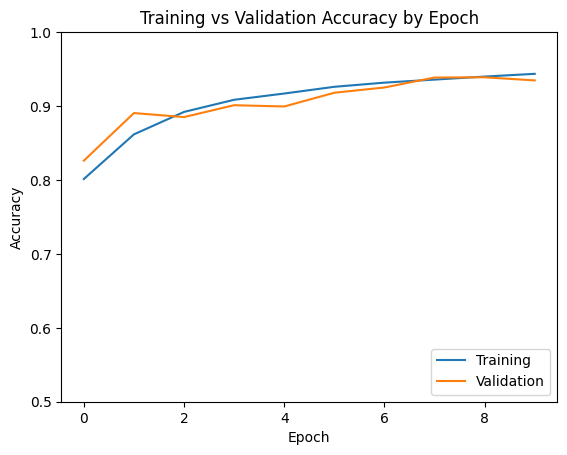

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_8')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')

In [ ]:
# Iteration 9: Baseline arch from #4, but train to 20 epochs
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy'])

model.summary()

Model: "Model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Convolution_1_1 (Conv2D)    (None, 94, 94, 32)        896       
                                                                 
 Convolution_1_2 (Conv2D)    (None, 92, 92, 32)        9248      
                                                                 
 Max_Pool_1 (MaxPooling2D)   (None, 46, 46, 32)        0         
                                                                 
 Convolution_2_1 (Conv2D)    (None, 44, 44, 64)        18496     
                                                                 
 Convolution_2_2 (Conv2D)    (None, 42, 42, 64)        36928     
                                                                 
 Max_Pool_2 (MaxPooling2D)   (None, 21, 21, 64)        0         
                                                                 
 Convolution_3_1 (Conv2D)    (None, 19, 19, 128)       7385

In [ ]:
history = model.fit(trn_data_gen, epochs=20, validation_data=val_data_gen)

Epoch 1/20
688/688 [==============================] - 141s 201ms/step - loss: 0.4417 - accuracy: 0.7974 - val_loss: 0.3597 - val_accuracy: 0.8449
Epoch 2/20
688/688 [==============================] - 138s 201ms/step - loss: 0.3362 - accuracy: 0.8555 - val_loss: 0.2817 - val_accuracy: 0.8846
Epoch 3/20
688/688 [==============================] - 140s 203ms/step - loss: 0.2730 - accuracy: 0.8872 - val_loss: 0.2398 - val_accuracy: 0.9038
Epoch 4/20
688/688 [==============================] - 139s 202ms/step - loss: 0.2380 - accuracy: 0.9045 - val_loss: 0.2157 - val_accuracy: 0.9155
Epoch 5/20
688/688 [==============================] - 138s 200ms/step - loss: 0.2112 - accuracy: 0.9170 - val_loss: 0.1990 - val_accuracy: 0.9220
Epoch 6/20
688/688 [==============================] - 137s 200ms/step - loss: 0.1959 - accuracy: 0.9234 - val_loss: 0.1973 - val_accuracy: 0.9234
Epoch 7/20
688/688 [==============================] - 137s 200ms/step - loss: 0.1828 - accuracy: 0.9297 - val_loss: 0.1782 -

In [17]:
history = load('/content/drive/MyDrive/ML3_hist/history_09')
history.history['val_accuracy']

[0.8448585271835327,
 0.8846040368080139,
 0.9037836790084839,
 0.9155095815658569,
 0.922031581401825,
 0.9234178066253662,
 0.9333939552307129,
 0.9317123293876648,
 0.9339393377304077,
 0.9291898608207703,
 0.9395068883895874,
 0.9360981583595276,
 0.940779447555542,
 0.9427792429924011,
 0.9385069608688354,
 0.9385751485824585,
 0.9399386644363403,
 0.9349846839904785,
 0.928803563117981,
 0.9371435046195984]

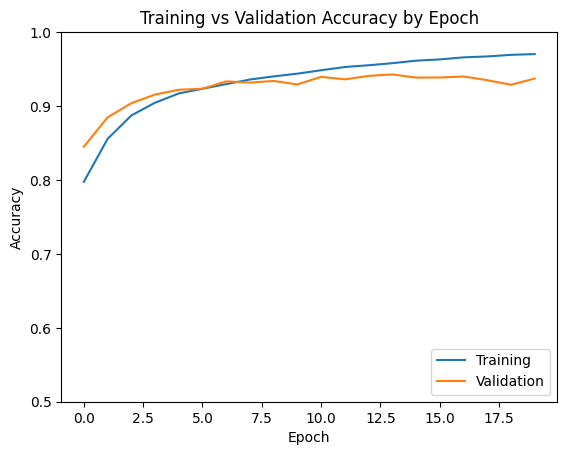

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_9')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')

In [ ]:
# Iteration 10: More epochs combined with exponential decay LR.
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

lr_schedule = ExponentialDecay(initial_learning_rate=0.001,
                               decay_steps=100000,
                               decay_rate=0.96,
                               staircase=True)
adam_optimizer = Adam(learning_rate=lr_schedule)

model.compile(optimizer=adam_optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(trn_data_gen, epochs=20, validation_data=val_data_gen)

Epoch 1/20
688/688 [==============================] - 140s 201ms/step - loss: 0.4444 - accuracy: 0.7957 - val_loss: 0.3717 - val_accuracy: 0.8396
Epoch 2/20
688/688 [==============================] - 137s 199ms/step - loss: 0.3354 - accuracy: 0.8559 - val_loss: 0.2974 - val_accuracy: 0.8747
Epoch 3/20
688/688 [==============================] - 141s 205ms/step - loss: 0.2689 - accuracy: 0.8891 - val_loss: 0.2404 - val_accuracy: 0.9028
Epoch 4/20
688/688 [==============================] - 138s 201ms/step - loss: 0.2347 - accuracy: 0.9063 - val_loss: 0.2194 - val_accuracy: 0.9148
Epoch 5/20
688/688 [==============================] - 139s 202ms/step - loss: 0.2084 - accuracy: 0.9182 - val_loss: 0.2398 - val_accuracy: 0.9056
Epoch 6/20
688/688 [==============================] - 138s 201ms/step - loss: 0.1901 - accuracy: 0.9266 - val_loss: 0.2115 - val_accuracy: 0.9176
Epoch 7/20
688/688 [==============================] - 139s 202ms/step - loss: 0.1764 - accuracy: 0.9327 - val_loss: 0.1762 -

In [18]:
history = load('/content/drive/MyDrive/ML3_hist/history_10')
history.history['val_accuracy']

[0.8396318554878235,
 0.8747187852859497,
 0.9027610421180725,
 0.9148051142692566,
 0.9055789113044739,
 0.9175547957420349,
 0.9344847202301025,
 0.9302806258201599,
 0.9330075979232788,
 0.9376434683799744,
 0.939484179019928,
 0.9349619150161743,
 0.9319168329238892,
 0.9357345700263977,
 0.9402340650558472,
 0.9400749802589417,
 0.9424383640289307,
 0.942892849445343,
 0.9407340288162231,
 0.9416429996490479]

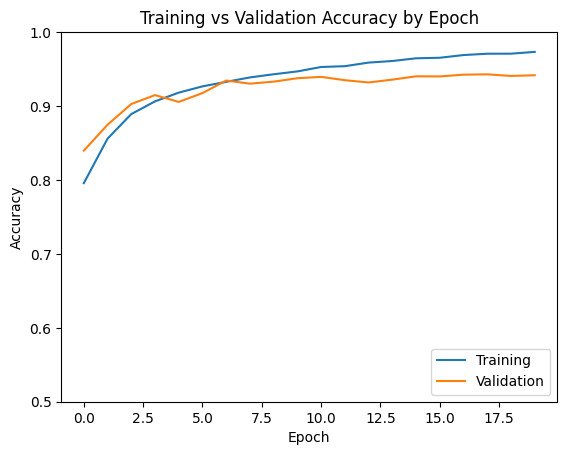

In [ ]:
dump(history, '/content/drive/MyDrive/ML3_hist/history_10')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label = 'Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.title('Training vs Validation Accuracy by Epoch')
plt.legend(loc='lower right')

---
### 5. Results and Discussion

Overall, I'm pretty happy with the results. By changing the model architecture, I was able to achieve small but significant improvements to the prediction scores, without requiring a huge number of parameters. Using exponential decay learning rate scheduler allowed relatively quick convergence without overfitting.

Given more time to improve the model, I might try the RMSProp optimizer and different parameters for the learning rate scheduler.


---

### 6. Test predictions and Kaggle submission

I retrained a model using the settings in Iteration 10, made predictions for the test data set and submitted to Kaggle for scoring. I achieved a **0.9369** score on the public leaderboard.

In [ ]:
# Iteration 10: More epochs combined with exponential decay LR.
# Arch: 2x2 strides, 2 conv layers, 1 fully connected layer with 32 units
# Compile options: Adam, BCE

strides = (1,1)
model = Sequential([
    Input((96,96,3), name='Input'),

    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_1'),
    Conv2D(32, (3,3), strides=strides, activation='relu', name='Convolution_1_2'),
    MaxPooling2D((2,2), name='Max_Pool_1'),

    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_1', ),
    Conv2D(64, (3,3), strides=strides, activation='relu', name='Convolution_2_2', ),
    MaxPooling2D((2,2), name='Max_Pool_2'),

    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_1'),
    Conv2D(128, (3,3), strides=strides, activation='relu', name='Convolution_3_2'),
    MaxPooling2D((2,2), name='Max_Pool_3'),

    Flatten(name='Flatten_for_output'),
    Dropout(0.5, name='Output_dropout'),

    Dense(128, activation='relu', name='Output_dense_1'),
    Dense(64, activation='relu', name='Output_dense_2'),

    Dense(1, activation='sigmoid', name='Classifier')
], name='Model_3')

lr_schedule = ExponentialDecay(initial_learning_rate=0.001,
                               decay_steps=100000,
                               decay_rate=0.96,
                               staircase=True)
adam_optimizer = Adam(learning_rate=lr_schedule)

model.compile(optimizer=adam_optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
%%time
model.fit(trn_data_gen, epochs=20, validation_data=val_data_gen)

Epoch 1/20
688/688 [==============================] - 148s 204ms/step - loss: 0.4386 - accuracy: 0.7985 - val_loss: 0.3852 - val_accuracy: 0.8355
Epoch 2/20
688/688 [==============================] - 142s 207ms/step - loss: 0.3190 - accuracy: 0.8646 - val_loss: 0.2800 - val_accuracy: 0.8856
Epoch 3/20
688/688 [==============================] - 135s 196ms/step - loss: 0.2591 - accuracy: 0.8939 - val_loss: 0.2326 - val_accuracy: 0.9097
Epoch 4/20
688/688 [==============================] - 142s 206ms/step - loss: 0.2270 - accuracy: 0.9103 - val_loss: 0.2084 - val_accuracy: 0.9181
Epoch 5/20
688/688 [==============================] - 138s 200ms/step - loss: 0.2059 - accuracy: 0.9196 - val_loss: 0.2064 - val_accuracy: 0.9201
Epoch 6/20
688/688 [==============================] - 136s 197ms/step - loss: 0.1881 - accuracy: 0.9281 - val_loss: 0.1965 - val_accuracy: 0.9233
Epoch 7/20
688/688 [==============================] - 132s 191ms/step - loss: 0.1760 - accuracy: 0.9325 - val_loss: 0.1823 -

In [ ]:
preds = model.predict(tst_data_gen)
dump(preds, '/content/drive/MyDrive/kaggle/ml3_preds')
preds = load('/content/drive/MyDrive/kaggle/ml3_preds')

225/225 [==============================] - 35s 155ms/step


['/content/drive/MyDrive/kaggle/ml3_preds']

In [ ]:
test_df['id'] = test_df['file_name'].apply(lambda x: x.split('.')[0])

In [ ]:
test_df['label'] = preds.reshape(-1)

In [ ]:
submission = test_df[['id', 'label']]
submission.to_csv('/content/drive/MyDrive/kaggle/submission.csv', index=False)

In [ ]:
submission

,id,label
0,1c9de83a0cb3e8918884719a158fc4cad3f9d1af,0.014797
1,b383c963d3236b55a941f9a9503d198ff5491116,0.685709
2,35b99f7e8df4882ade0ff57aa0f2ae511911b371,0.970075
3,f78b7600773617b56ec78af1cea5e827422a2a80,0.982597
4,9c2041bad259eecdf62dcd24c9a75c14a37b6363,0.005376
...,...,...
57453,680382b1e26f22d8b36f5b809b04d6920bc78607,0.993812
57454,9ee5a93349fb649335787585ed5f77d6a8185054,0.017764
57455,a3a4e7a165fdb629fa995317e3393372f19ad267,0.290335
57456,35a2ab6b18fd10d3125144146711e62c79edc52c,0.996142
